In [1]:
# Importing package.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px


In [2]:
# Reading CSV file into Pandas DataFrame.

cr = pd.read_csv('Customer Retention Case Study Data.csv')

In [3]:
# Printing first 5 records of the dataset.

cr.head()

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration
0,M,21,79070.91,Individuals,0,I,0,1,0,1035
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440
4,M,31,112975.17,Individuals,0,I,0,0,0,376


In [4]:
# Undrstanding data types.

cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54030 entries, 0 to 54029
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 54030 non-null  object 
 1   age                    54030 non-null  int64  
 2   gross_income           54030 non-null  float64
 3   segment                54030 non-null  object 
 4   num_credit_cards       54030 non-null  int64  
 5   active_inactive_start  54030 non-null  object 
 6   active_inactive_end    54030 non-null  int64  
 7   num_products           54030 non-null  int64  
 8   num_loans              54030 non-null  int64  
 9   duration               54030 non-null  int64  
dtypes: float64(1), int64(6), object(3)
memory usage: 4.1+ MB


In [5]:
# Checking for null values.

cr.isnull().sum()

gender                   0
age                      0
gross_income             0
segment                  0
num_credit_cards         0
active_inactive_start    0
active_inactive_end      0
num_products             0
num_loans                0
duration                 0
dtype: int64

In [6]:
# Checking dimension of dataframe

cr.shape

(54030, 10)

In [7]:
# Checking data included as Objects

cr.describe(include = ['O'])

,gender,segment,active_inactive_start
count,54030,54030,54030
unique,2,3,2
top,F,Individuals,I
freq,29681,32607,29026


In [8]:
cr['customer_duration'] = 365

In [9]:
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365
...,...,...,...,...,...,...,...,...,...,...,...
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365
54027,M,24,185323.05,College_Graduated,0,I,0,0,0,1817,365
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365


In [10]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54030 entries, 0 to 54029
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 54030 non-null  object 
 1   age                    54030 non-null  int64  
 2   gross_income           54030 non-null  float64
 3   segment                54030 non-null  object 
 4   num_credit_cards       54030 non-null  int64  
 5   active_inactive_start  54030 non-null  object 
 6   active_inactive_end    54030 non-null  int64  
 7   num_products           54030 non-null  int64  
 8   num_loans              54030 non-null  int64  
 9   duration               54030 non-null  int64  
 10  customer_duration      54030 non-null  int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 4.5+ MB


In [11]:
# Converted duration from days into year

cr['duration_years'] = cr['duration'] / cr['customer_duration']

In [12]:
cr

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137
...,...,...,...,...,...,...,...,...,...,...,...,...
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479
54027,M,24,185323.05,College_Graduated,0,I,0,0,0,1817,365,4.978082
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384


In [13]:
cr.drop_duplicates(inplace = True)

In [14]:
cr.describe()

,age,gross_income,num_credit_cards,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
count,52839.000000,5.283900e+04,52839.000000,52839.000000,52839.000000,52839.000000,52839.000000,52839.0,52839.000000
mean,40.782490,1.342687e+05,0.050228,0.469634,1.537898,0.009330,2914.713242,365.0,7.985516
std,17.203393,2.418738e+05,0.218417,0.499082,1.581192,0.096142,2028.241321,0.0,5.556826
min,2.000000,2.336010e+03,0.000000,0.000000,0.000000,0.000000,366.000000,365.0,1.002740
25%,25.000000,6.861658e+04,0.000000,0.000000,1.000000,0.000000,1118.000000,365.0,3.063014
50%,40.000000,1.015898e+05,0.000000,0.000000,1.000000,0.000000,2048.000000,365.0,5.610959
75%,51.000000,1.560876e+05,0.000000,1.000000,2.000000,0.000000,4691.500000,365.0,12.853425
max,112.000000,2.889440e+07,1.000000,1.000000,13.000000,1.000000,7909.000000,365.0,21.668493


In [15]:
cr.to_csv(r'C:\Users\jay62\Downloads\Course 29\Case Study 4_Customer Retention\eda_cr_file.csv')

In [16]:
all_time_active = cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)]
m_all_time_active = all_time_active['gender'] == 'M'
f_all_time_active = all_time_active['gender'] == 'F'
m_f_active_all_time = [m_all_time_active & f_all_time_active]

In [17]:
active_from_b_e = cr['active_inactive_start'] == 'A'
active_after_six_months = cr['active_inactive_end'] == 1
active_all_time = cr[active_from_b_e & active_after_six_months]

In [18]:
cr['age_group'] = pd.cut(x = cr['age'], bins = [0,18,30,58,120],
                        labels = ['Minor' , 'Young Adult' , 'Middle Aged Adult' , 'Senior'])

In [19]:
cr.corr()

,age,gross_income,num_credit_cards,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years
age,1.000000,0.067872,0.095962,0.136667,0.178277,0.042718,0.599903,NaN,0.599903
gross_income,0.067872,1.000000,0.020429,0.024589,0.035704,0.002352,0.077854,NaN,0.077854
num_credit_cards,0.095962,0.020429,1.000000,0.241605,0.552409,0.112872,0.188585,NaN,0.188585
active_inactive_end,0.136667,0.024589,0.241605,1.000000,0.548221,0.093665,0.152135,NaN,0.152135
num_products,0.178277,0.035704,0.552409,0.548221,1.000000,0.206764,0.316047,NaN,0.316047
num_loans,0.042718,0.002352,0.112872,0.093665,0.206764,1.000000,0.101100,NaN,0.101100
duration,0.599903,0.077854,0.188585,0.152135,0.316047,0.101100,1.000000,NaN,1.000000
customer_duration,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration_years,0.599903,0.077854,0.188585,0.152135,0.316047,0.101100,1.000000,NaN,1.000000


[Text(0.5, 1.0, ' Correlation Heatmap ')]

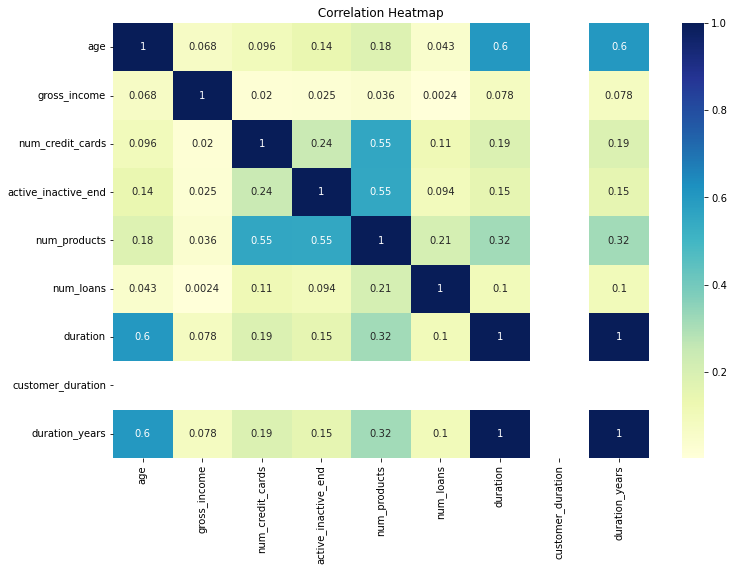

In [20]:
fig , ax = plt.subplots(figsize=(12, 8))


sns.heatmap(cr.corr(), annot = True , ax = ax, cmap="YlGnBu").set(
    title = " Correlation Heatmap ")

### A heatmap was created to show the general relationship of all variables and how they are related.

# Customer and Segment Analysis

## Customer count

In [21]:
cr['gender'].value_counts()
customer_count = [29025 + 23814]
customer_count

[52839]

## Gender wise customer count 

In [22]:
cr['gender'].value_counts()

F    29025
M    23814
Name: gender, dtype: int64

Text(0, 0.5, 'Gender')

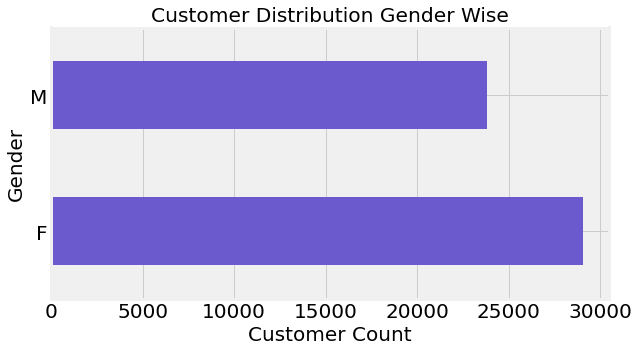

In [23]:
plt.figure(figsize = (10,5))
plt.style.use('fivethirtyeight')
cr['gender'].value_counts().plot(kind = 'barh' , title = 'Customer Distribution Gender Wise',
                                   fontsize = '20' , color = 'slateblue')

plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Gender' , fontsize=20, color="black")

### The dataset contains 23814 males and 29025 females.

## Customer distribution age wise

Text(0.5, 0, 'Age')

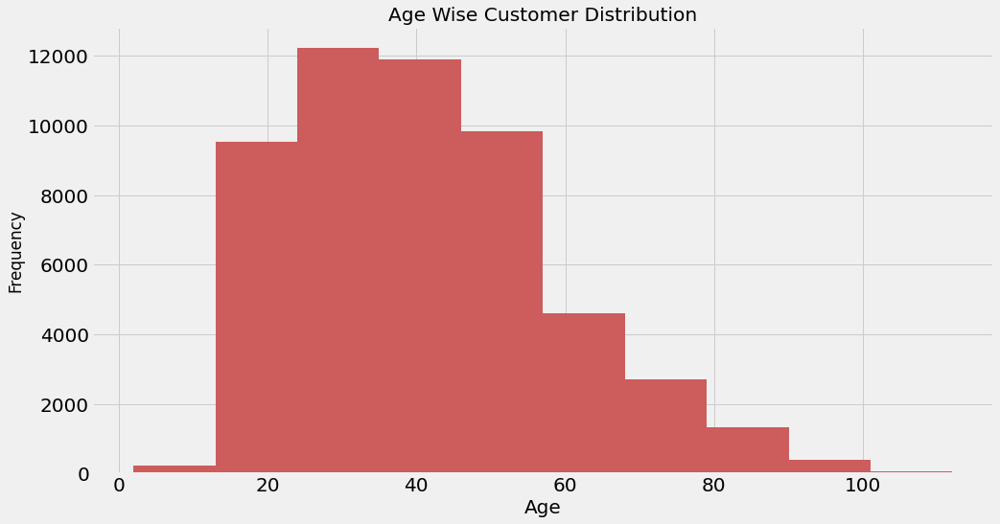

In [24]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (15,8))
cr['age'].plot(kind = 'hist' , title = 'Age Wise Customer Distribution',
                                   fontsize = '20' , color = 'indianred')

plt.xlabel('Age' , fontsize=20, color="black")

### The age distribution and count. The majority of our consumers are in their twenties, thirties, forties and fifties.


## Age group wise total count

In [25]:
cr['age_group'].value_counts()

Middle Aged Adult    25486
Young Adult          18792
Senior                7993
Minor                  568
Name: age_group, dtype: int64

## Age group wise total gender & segment count
### (Plotted down below)

In [26]:
crosstab = pd.crosstab(index=[cr["age_group"],cr['segment'] , cr['gender']], columns="count")
crosstab

col_0                                       count
age_group         segment           gender       
Minor             Individuals       F         289
                                    M         279
Young Adult       College_Graduated F        7531
                                    M        9862
                  Individuals       F         829
                                    M         561
                  VIP               F           6
                                    M           3
Middle Aged Adult College_Graduated F         566
                                    M         542
                  Individuals       F       13939
                                    M        8860
                  VIP               F        1030
                                    M         549
Senior            College_Graduated F           5
                                    M           4
                  Individuals       F        4325
                                    M        2822
                  VIP               F         505
                                    M         332

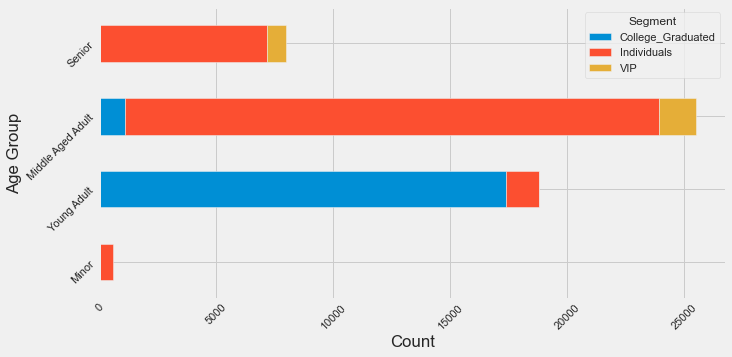

In [93]:
crosstab = pd.crosstab(cr['age_group'] , cr['segment'])
crosstab.plot(kind = 'barh',  stacked = True, figsize = (10,5))
plt.xlabel("Count")
plt.ylabel("Age Group")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.legend(title="Segment", bbox_to_anchor=(1, 1))

### The Individuals category has a higher proportion of middle-aged adults. The majority of young adults are college graduates, while VIPs are senior and middle-aged adults.

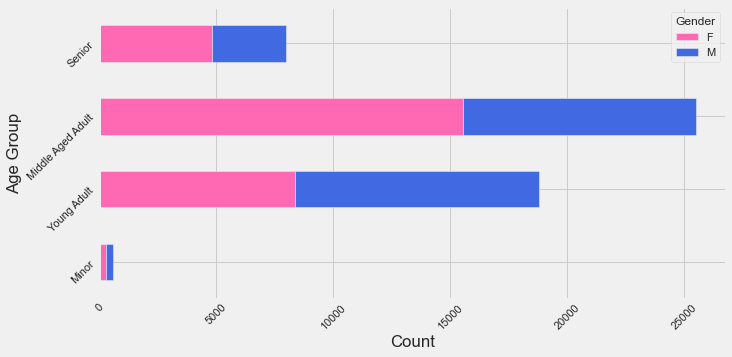

In [107]:
crosstab = pd.crosstab(cr['age_group'] , cr['gender'])
crosstab.plot(kind = 'barh',  stacked = True, figsize = (10,5) , color = ['hotpink' , 'royalblue'])
plt.xlabel("Count")
plt.ylabel("Age Group")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.legend(title="Gender", bbox_to_anchor=(1, 1))

### Gender is largely evenly distributed across all age groups, with the exception of a small rise in the middle-aged adult group.


## Top 20 count of customer by age group
### (Plotted down - top 50)

In [29]:
cr['age'].value_counts().sort_values().nlargest(20)

23    3003
24    2799
22    2759
21    2293
25    1781
26    1386
45    1330
43    1313
44    1294
42    1283
46    1250
41    1243
47    1146
40    1110
48    1107
27    1103
20    1070
39    1010
49     966
50     957
Name: age, dtype: int64

## Top 50 by age group

<AxesSubplot:title={'center':'Age Wise Top 50 Customer Count In Ascending Order'}>

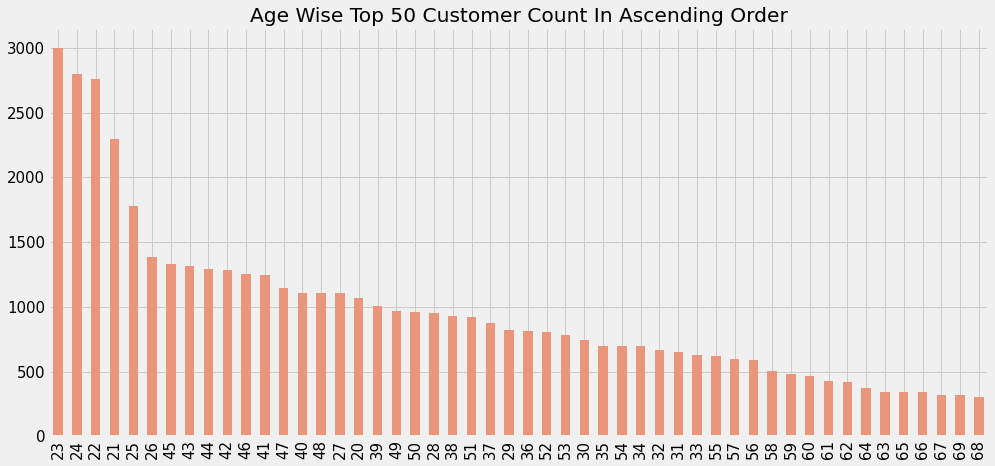

In [30]:
plt.figure(figsize=(15,7))

cr['age'].value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Top 50 Customer Count In Ascending Order', 
                                   fontsize = '15' , color = 'darksalmon')

### The top six total consumers are in their 20s, followed by the 40s, where we have a good number of total customers. The remaining consumers are in their 30s, 50s, and 60s.


### Because the most clients in their 20s, we have mapped more for them down below.

## Segment wise customer specifically in their 20s (top 6 customer count)

### (The overall segment distribution is plotted below)

In [31]:
top_customer_count = cr['age'].isin([23,24,22,21,25,26])
top_customer_count.sum()

14021

<AxesSubplot:title={'center':'Customer In 20s Segment Wise (Top 6)'}>

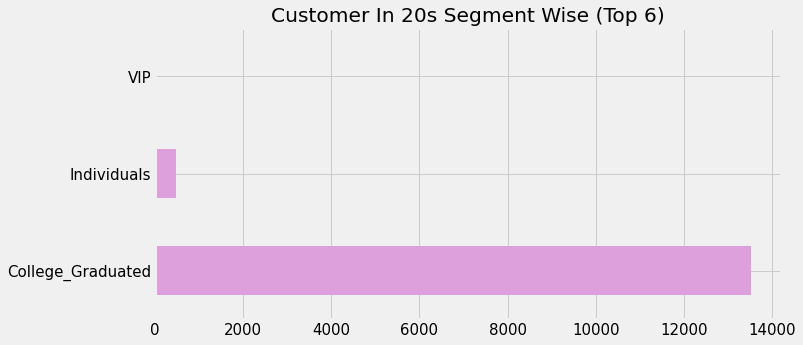

In [32]:
plt.figure(figsize=(10,5))

cr[top_customer_count].segment.value_counts().plot(kind = 'barh' , title = 'Customer In 20s Segment Wise (Top 6)', 
                                   fontsize = '15' , color = 'plum')

### The majority of our consumers are from the College Graduated section, with only a handful from the Individuals group. We don't have any VIP customers in the top six.


## Segment and customer count

[Text(0.5, 1.0, ' Segment Wise Product Distribution ')]

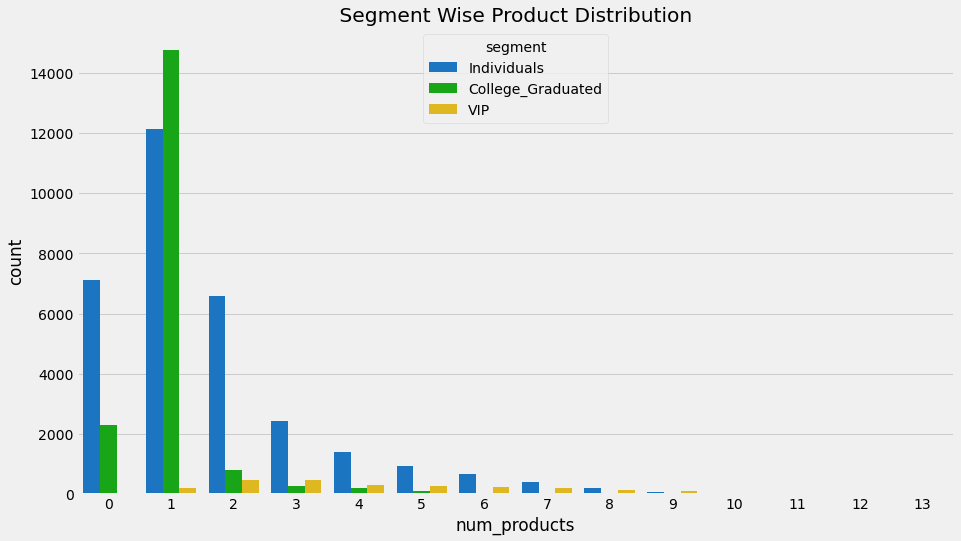

In [33]:
fig , ax = plt.subplots(figsize=(14, 8))

sns.countplot(data= cr, x='num_products', hue = 'segment' , ax = ax , palette = 'nipy_spectral').set(
    title = " Segment Wise Product Distribution ")

### The majority of our customers have only one product from us, and they are from the Individuals and College Grads group. Individuals should receive the most attention because they are more likely to own multiple things.

## Total number of customers who got only 1 product

In [34]:
cr[cr['num_products'] == 1].value_counts().sum()

27108

## Customer in their 20s and product (top 6)

### (Top 6 customers in 20s and their product count)

In [35]:
cr[top_customer_count].num_products.value_counts()

1    11338
0     1908
2      528
3      144
4       69
5       25
6        8
7        1
Name: num_products, dtype: int64

<AxesSubplot:title={'center':'Customer In 20s Having A Product'}>

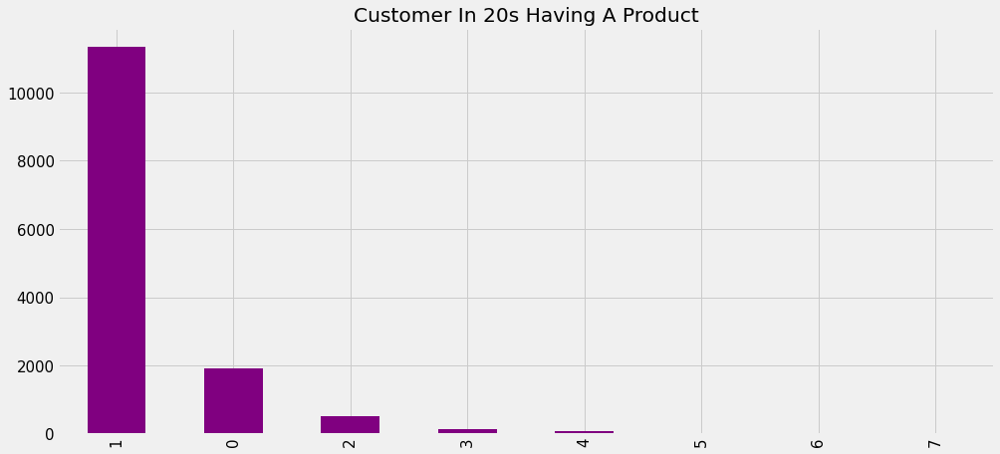

In [36]:
plt.figure(figsize=(15,7))

cr[top_customer_count].num_products.value_counts().plot(kind = 'bar' , title = 'Customer In 20s Having A Product', 
                                   fontsize = '15' , color = 'purple')

### We sold 1 product to a total of 27108 people, however 11338 (around 42%) of those customers were in the early and mid 20s category.


## Top 50 smallest amount of customer count 

<AxesSubplot:title={'center':'Age Wise Top 50 Customer Count In Descending Order'}>

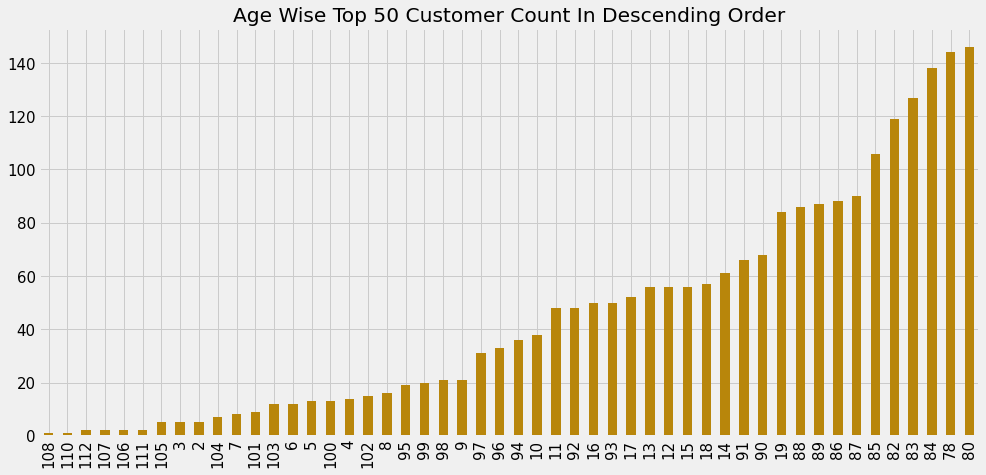

In [37]:
plt.figure(figsize=(15,7))
cr['age'].value_counts().nsmallest(50).plot(kind = 'bar' , title = 'Age Wise Top 50 Customer Count In Descending Order', 
                                   fontsize = '15' , color = 'darkgoldenrod')

### We have less elderly and minor customers.


## Segment wise customer count

In [38]:
cr['segment'].value_counts() 

Individuals          31904
College_Graduated    18510
VIP                   2425
Name: segment, dtype: int64

Text(0.5, 0, 'Customer Count')

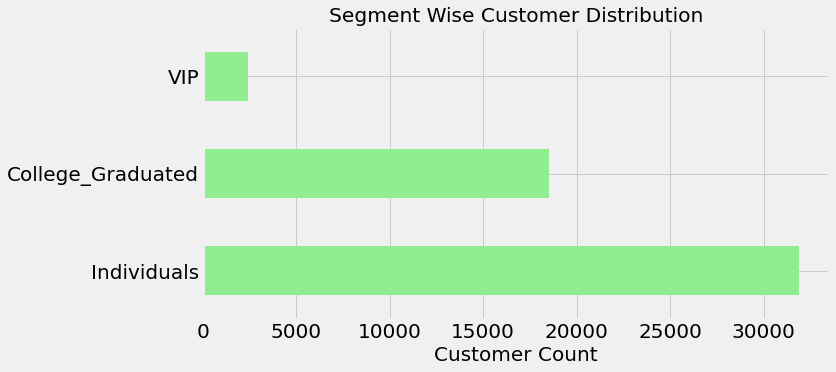

In [39]:
plt.figure(figsize = (10,5))
cr['segment'].value_counts().plot(kind = 'barh' , title = 'Segment Wise Customer Distribution',
                                   fontsize = '20' , color = 'lightgreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")

### The individual segment has the most customers, followed by college graduates and VIPs.

## Segment wise average age

In [40]:
cr.groupby('segment')['age'].mean()

segment
College_Graduated    24.407834
Individuals          49.168913
VIP                  55.435876
Name: age, dtype: float64

Text(0, 0.5, 'Segment')

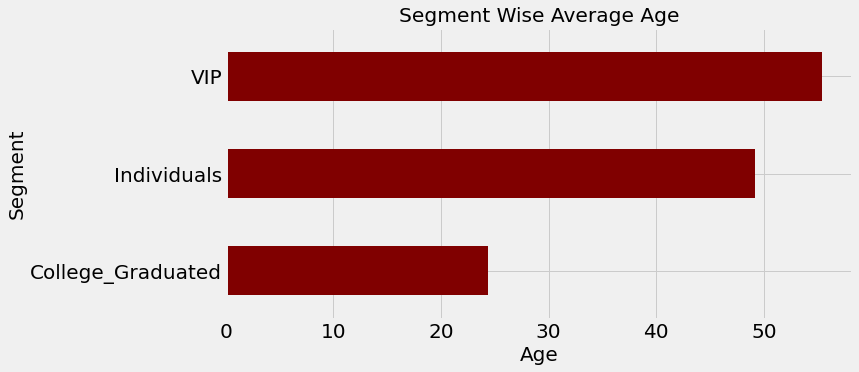

In [41]:
plt.figure(figsize = (10,5))
cr.groupby('segment')['age'].mean().plot(kind = 'barh', title = 'Segment Wise Average Age',
                                   fontsize = '20' , color = 'maroon')
plt.xlabel('Age' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")

### According to the segment, the average age is 24.40 for College Graduates, 49.16 for Individuals, and 55.43 for VIPs.


## Age wise customer distribution in all 3 segments

In [42]:
seg_1 = cr['segment'] == 'Individuals'
seg_2 = cr['segment'] == 'College_Graduated'
seg_3 = cr['segment'] == 'VIP'

## Age Wise Largest 50 Count In Individual Segment

Text(0.5, 0, 'Age')

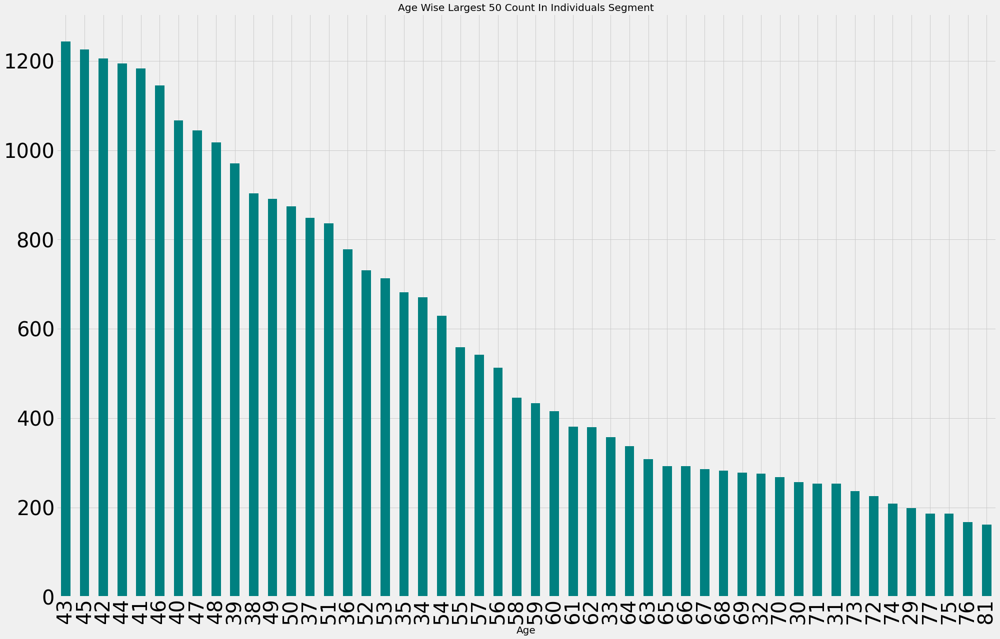

In [43]:
plt.figure(figsize = (30,20))
cr[seg_1].age.value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Largest 50 Count In Individuals Segment',
                                   fontsize = '40' , color = 'teal')
plt.xlabel('Age' , fontsize=20, color="black")

### We should focus more on clients in their 30s, 40s, and 50s because they make up the majority of the Individuals category.


## Age Wise Largest 30 Count In College Graduated Segment

Text(0.5, 0, 'Age')

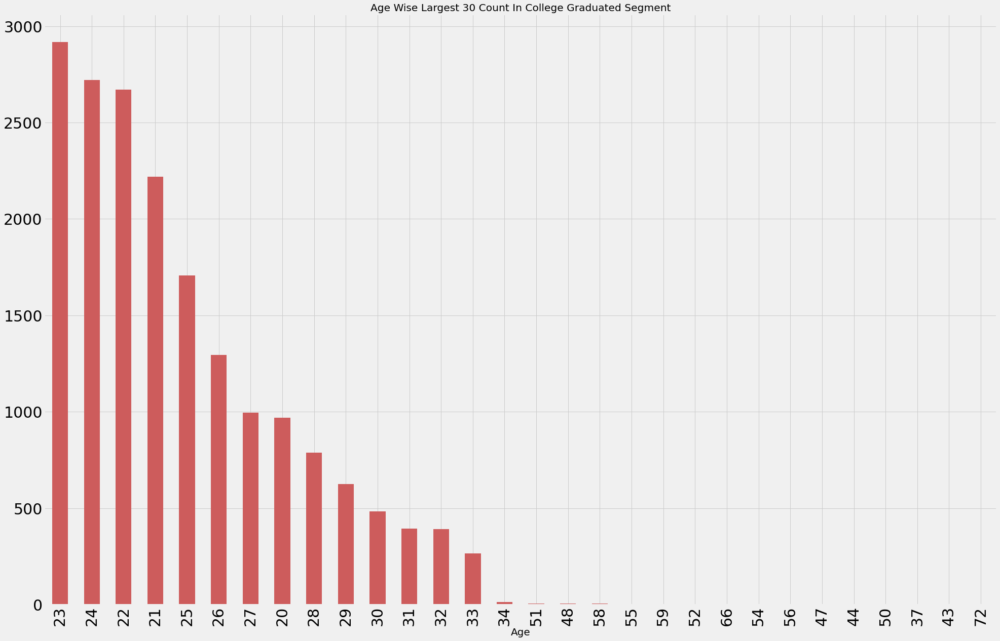

In [44]:
plt.figure(figsize = (30,20))
cr[seg_2].age.value_counts().nlargest(30).plot(kind = 'bar' , title = 'Age Wise Largest 30 Count In College Graduated Segment',
                                   fontsize = '30' , color = 'indianred')
plt.xlabel('Age' , fontsize=20, color="black")

### Customers in the College Grads category are primarily in their twenties, making them a good target for segment growth.
### They account for more than 42% of the total in a list of only one product.


## Age Wise Largest 30 Count In VIP Segment

Text(0.5, 0, 'Age')

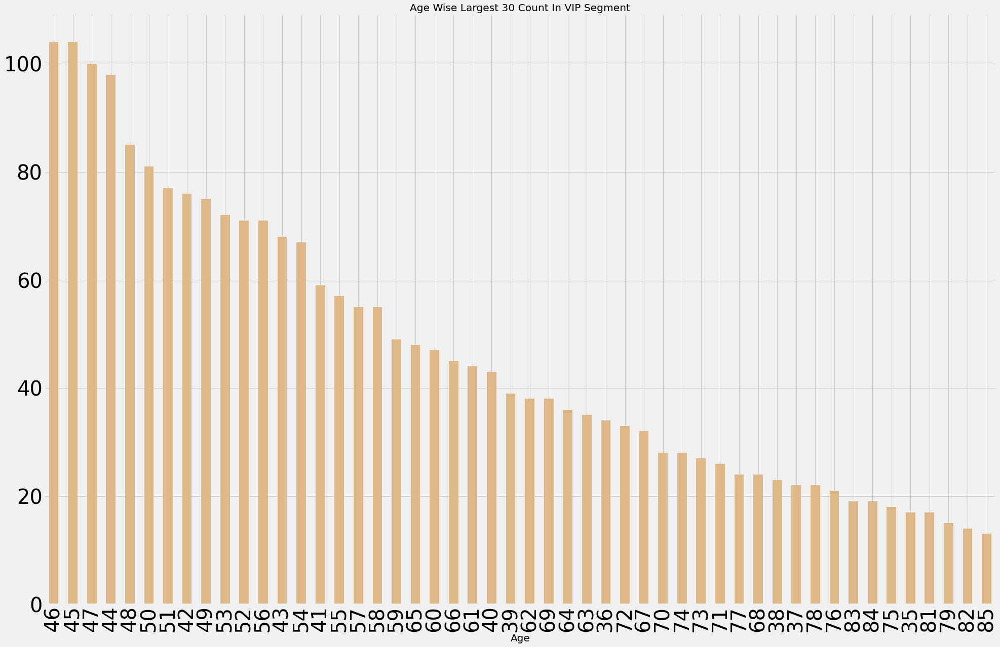

In [45]:
plt.figure(figsize = (30,20))
cr[seg_3].age.value_counts().nlargest(50).plot(kind = 'bar' , title = 'Age Wise Largest 30 Count In VIP Segment',
                                   fontsize = '40' , color = 'burlywood')
plt.xlabel('Age' , fontsize=20, color="black")

### The bulk of VIP customers are in their 40s, 50s, and 60s. This segment's average age is 55, so the target age group would have been between 40 and 60.

# Activity Analysis

## Active and In-active customer in first 6 months

In [46]:
cr['active_inactive_start'].value_counts()

I    28335
A    24504
Name: active_inactive_start, dtype: int64

Text(0, 0.5, 'Active and Inactive')

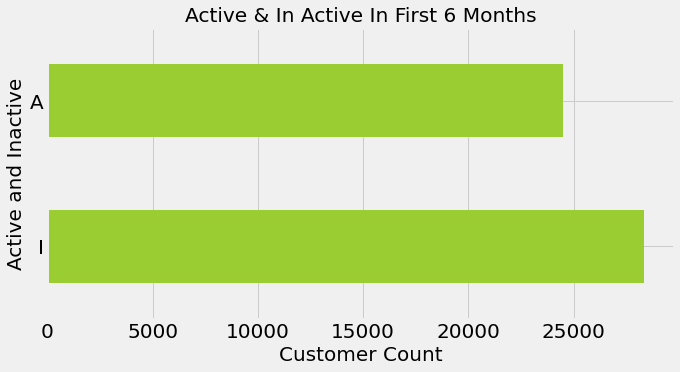

In [47]:
plt.figure(figsize = (10,5))
cr['active_inactive_start'].value_counts().plot(kind = 'barh' ,  title = 'Active & In Active In First 6 Months',
                                   fontsize = '20' , color = 'yellowgreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Active and Inactive' , fontsize=20, color="black")

### We have more in active consumers within the first six months of a customer's term.

## Active and In-active customer after 6 months

In [48]:
cr['active_inactive_end'].value_counts()

0    28024
1    24815
Name: active_inactive_end, dtype: int64

Text(0.5, 0, 'Customer Count')

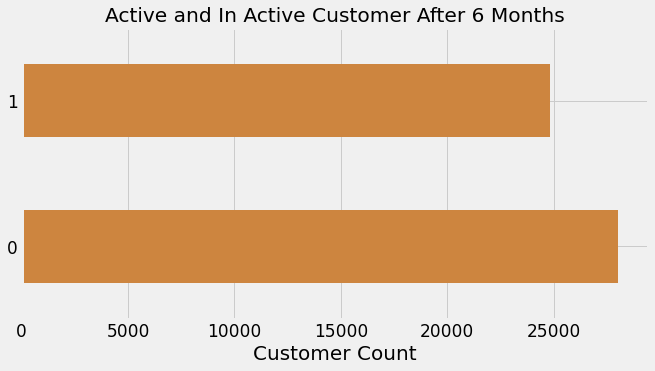

In [49]:
plt.figure(figsize=(10,5))
plt.style.use('fivethirtyeight')

cr['active_inactive_end'].value_counts().plot(kind = 'barh' , 
                                   title = 'Active and In Active Customer After 6 Months',
                                   fontsize = '17' , color = 'peru')

plt.xlabel('Customer Count' , fontsize=20, color="black")


### After 6 months, approximately 300 customers activity level increased.

### We will conduct more analysis on consumer activity after 6 months because we have detected a minor uptick in activity.


## Segment wise activity after 6 months

Text(0, 0.5, 'Segment')

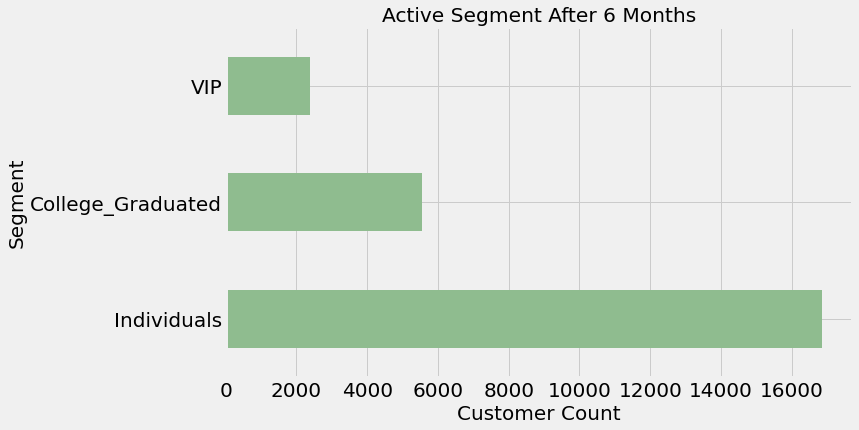

In [50]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')


active_after_six_months = cr['active_inactive_end'] == 1


cr[active_after_six_months].segment.value_counts().plot(kind = 'barh' , 
                                   title = 'Active Segment After 6 Months',
                                   fontsize = '20' , color = 'darkseagreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")

### When we divide clients by their six-month tenure, the Individual category is the most active, accounting for over half of the 32000 total customer count in this section.
### Out of 18510 consumers, around 5000 remained active in the College Graduate sector. 
### Interestingly, out of 2425 VIP customers, around 2100 remained active in the sector. 

## Segment wise IN ACTIVE customer after 6 months

In [51]:
cr[~active_after_six_months].segment.value_counts()

Individuals          15042
College_Graduated    12950
VIP                     32
Name: segment, dtype: int64

Text(0, 0.5, 'Segment')

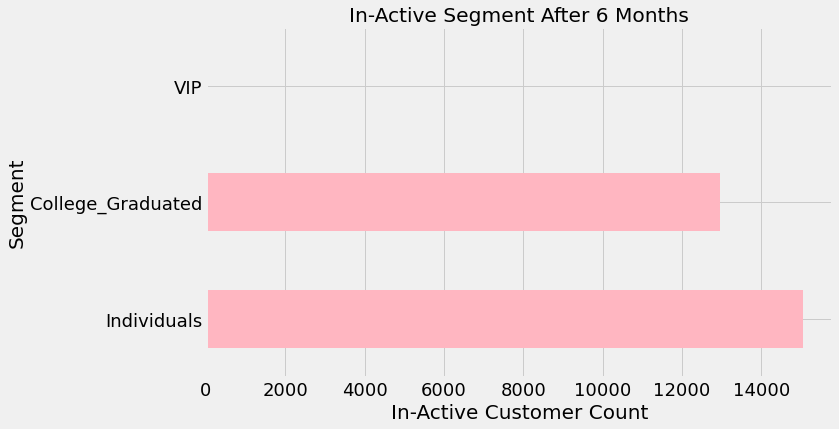

In [52]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')

cr[~active_after_six_months].segment.value_counts().plot(kind = 'barh' , 
                                   title = 'In-Active Segment After 6 Months', 
                                   fontsize = '18' , color = 'lightpink')
plt.xlabel('In-Active Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")

###  After six months, approximately 47% of Individuals and 70% of College Graduates remained inactive.
### We have only 32 inactive VIPs out of 2425 VIPs, demonstrating how important they are in the business across all segments.



## Customer activity status AFTER 6 months as per their tenure

[Text(0.5, 1.0, 'Customer Activity Status Segment Wise As Per Duration')]

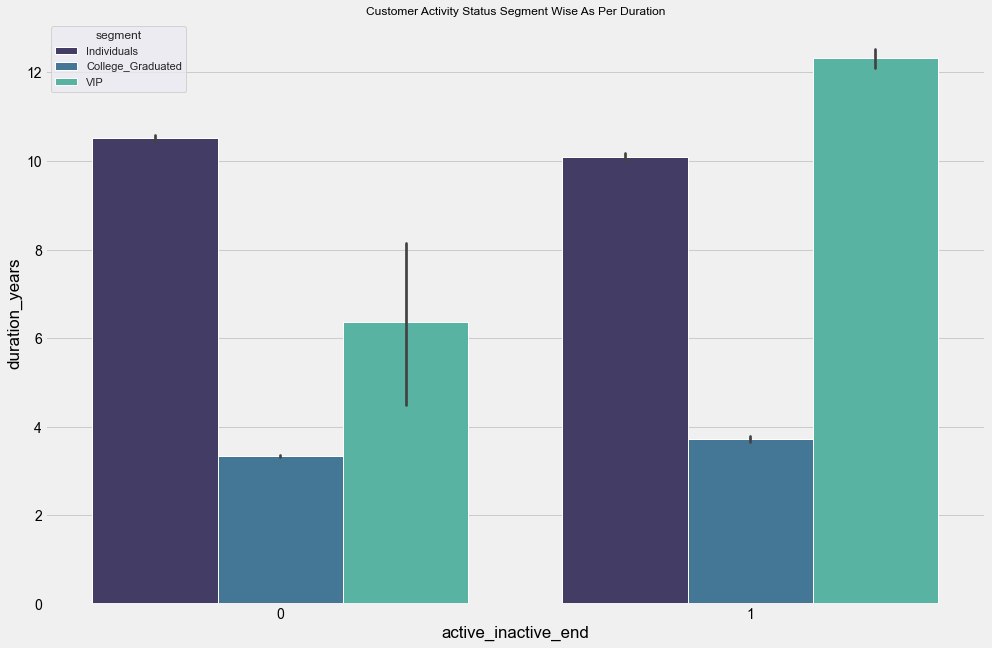

In [53]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="darkgrid", color_codes=True)


sns.barplot(data = cr, y = 'duration_years', x = 'active_inactive_end' , ax = ax , hue = 'segment' , palette = 'mako').set(
    title="Customer Activity Status Segment Wise As Per Duration")

### There is no association between customer duration and activity in the Individual and College Grads segments, with the exception of the VIP group, which clearly states that a greater number of their duration tends to enhance their activity.

## Customer activity status WITHIN 6 month as per their income

[Text(0.5, 1.0, 'Customer Activity Status Segment Wise As Per Duration')]

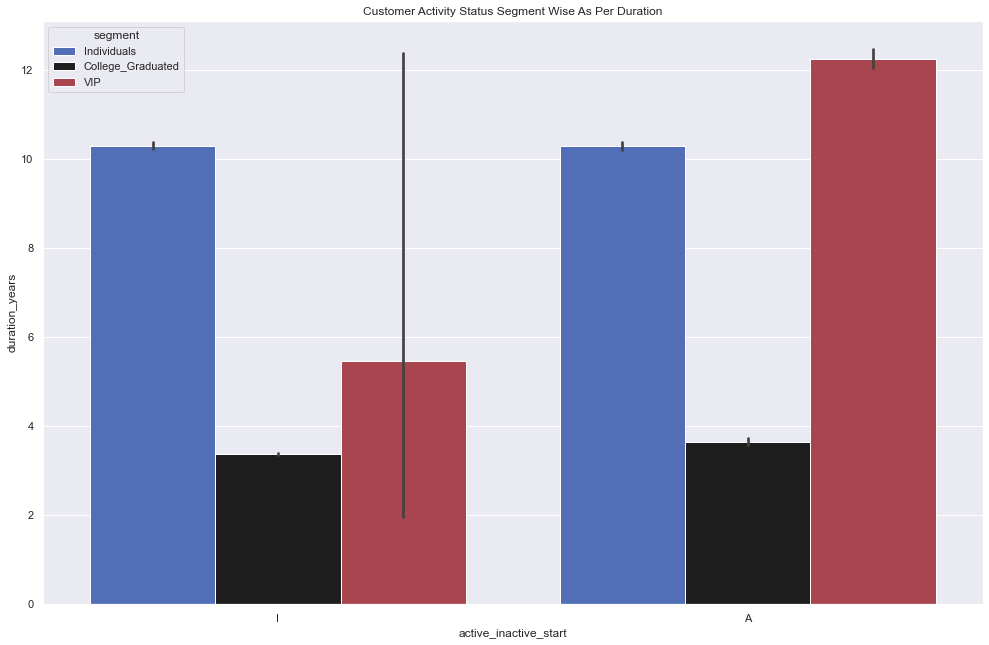

In [54]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="darkgrid", color_codes=True)


sns.barplot(data = cr, y = 'duration_years', x = 'active_inactive_start', hue = 'segment' , ax = ax, palette = 'icefire').set(
    title="Customer Activity Status Segment Wise As Per Duration")

### All segments have the same amount of activity at the beginning and end.

## Customer activity status AFTER 6 month as per their income

[Text(0.5, 1.0, 'Customer Activity Status Segment Wise As Per 6 Month Duration')]

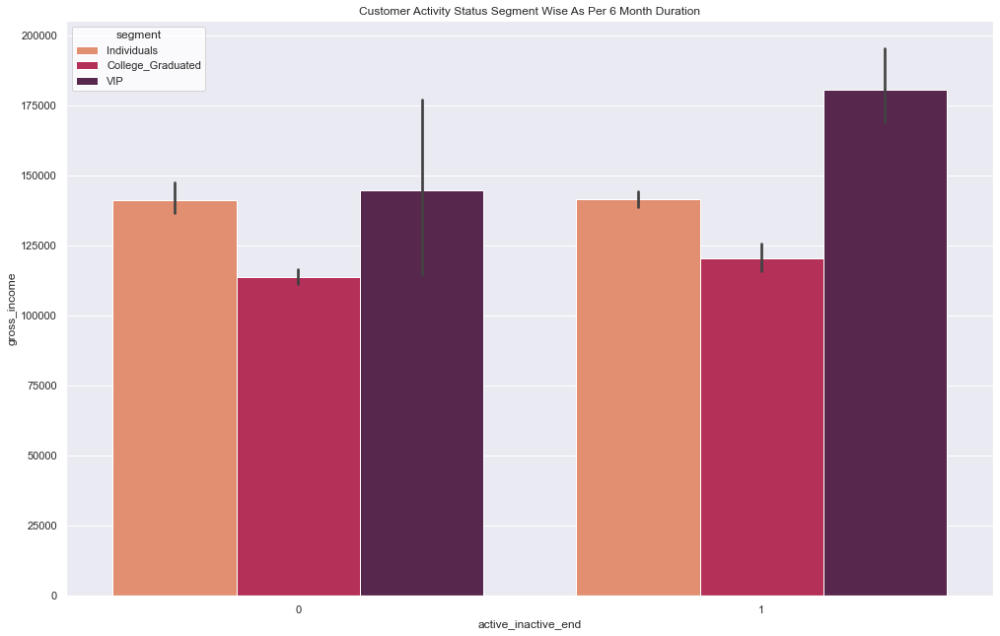

In [55]:
fig , ax = plt.subplots(figsize=(15, 10))
sns.set(style="whitegrid", color_codes=True)

sns.barplot(data = cr, y = 'gross_income', x = 'active_inactive_end', hue = 'segment' , ax = ax, palette = 'rocket_r').set(
    title="Customer Activity Status Segment Wise As Per 6 Month Duration")

### Income and client activity do not play a significant effect in their activity status.

## Gender wise all time activity within 6 month and after 6 month

In [56]:
cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)].gender.value_counts()

F    13084
M     9352
Name: gender, dtype: int64

Text(0, 0.5, 'Gender')

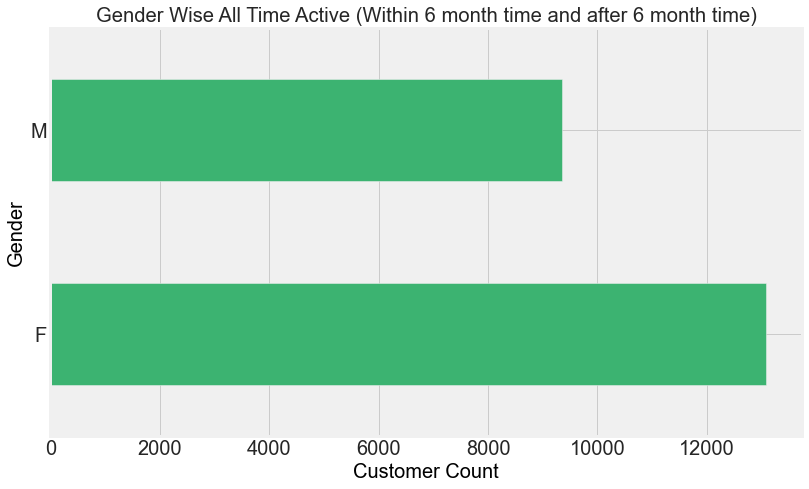

In [57]:
plt.figure(figsize=(12,7))
plt.style.use('fivethirtyeight')



cr[(cr['active_inactive_start'] == 'A') &  (cr['active_inactive_end'] == 1)].gender.value_counts().plot(kind = 'barh', 
                                   title = 'Gender Wise All Time Active (Within 6 month time and after 6 month time)', 
                                   fontsize = '20' , color = 'mediumseagreen')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Gender' , fontsize=20, color="black")

### It is worth noting that we have approximately 29000 female clients and approximately 24000 male in the data set, thus the female all-time activity count is much higher. 

## Income and customer activity gender wise

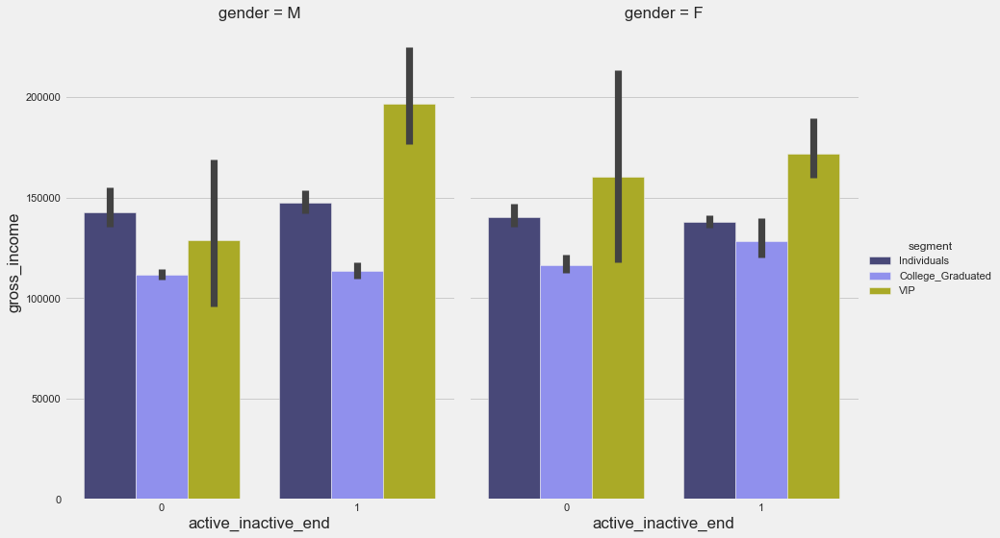

In [58]:
sns.catplot(data = cr, y = 'gross_income', x = 'active_inactive_end' , col = 'gender', kind = 'bar', hue = 'segment',
            palette = 'gist_stern', height= 8, aspect=.8)


### Gender wise, there is no positive relationship between consumer income and activity. It is worth noting that gross income and length are not important factors in a customer's overall activity.

## Customer activity after 6 months age wise

[Text(0.5, 1.0, 'Age Wise Active - 1  & In-Active - 0')]

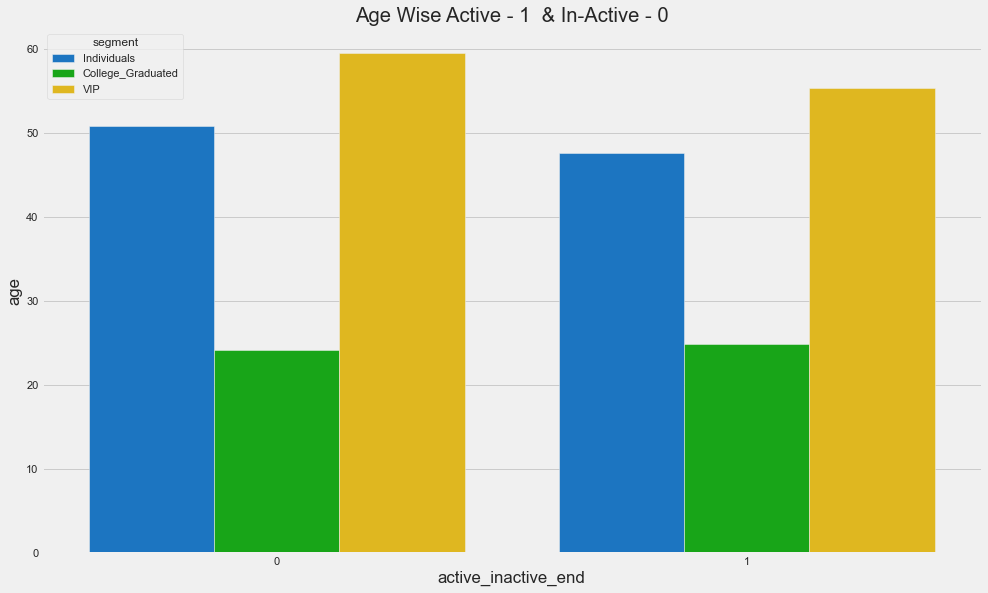

In [59]:
fig , ax = plt.subplots(figsize=(15, 9))

sns.barplot(data= cr, x='active_inactive_end', y = 'age', hue = 'segment' , ax = ax , palette = 'nipy_spectral', ci = None).set(
    title = "Age Wise Active - 1  & In-Active - 0")

### As observed in the previous chart, there is no association between age and activity as well.




# Gross Income and Product Analysis

In [60]:
active_before_six_month = cr['active_inactive_start'] == 'A'

active_all_before_six_month = cr['active_inactive_start']

## Gross income descriptive statistics

In [61]:
cr['gross_income'].describe()

count    5.283900e+04
mean     1.342687e+05
std      2.418738e+05
min      2.336010e+03
25%      6.861658e+04
50%      1.015898e+05
75%      1.560876e+05
max      2.889440e+07
Name: gross_income, dtype: float64

## Average gross income segment wise

In [62]:
cr.groupby('segment')['gross_income'].mean()

segment
College_Graduated    115790.894891
Individuals          141498.591188
VIP                  180191.585777
Name: gross_income, dtype: float64

<AxesSubplot:title={'center':'Average Gross Income Segment Wise'}, ylabel='gross_income'>

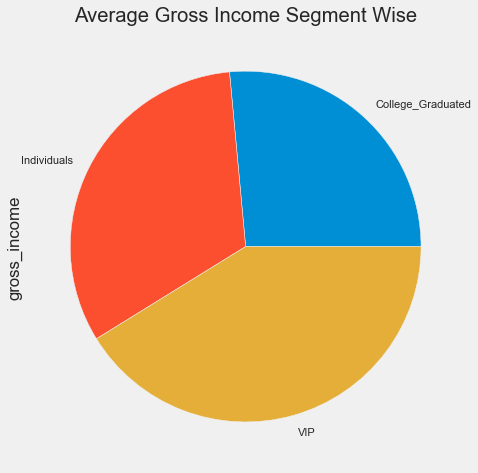

In [63]:
plt.figure(figsize=(7,15))

cr.groupby('segment')['gross_income'].mean().plot(kind = 'pie' , title = 'Average Gross Income Segment Wise')

### VIPs have significantly greater average income than the other two segments.



## Gross income Box Plot 

In [64]:
px.box(cr, y = 'gross_income')

### There were a significant number of outliers in the gross income column, therefore they were removed.


## Box plot whose income less than 287000

In [65]:
income = cr[cr['gross_income'] < 287000]

In [66]:
income

,gender,age,gross_income,segment,num_credit_cards,active_inactive_start,active_inactive_end,num_products,num_loans,duration,customer_duration,duration_years,age_group
0,M,21,79070.91,Individuals,0,I,0,1,0,1035,365,2.835616,Young Adult
1,M,23,178270.68,College_Graduated,0,I,0,1,0,1097,365,3.005479,Young Adult
2,M,24,31243.56,College_Graduated,0,I,1,1,0,1866,365,5.112329,Young Adult
3,M,24,130740.54,College_Graduated,0,I,0,1,0,1440,365,3.945205,Young Adult
4,M,31,112975.17,Individuals,0,I,0,0,0,376,365,1.030137,Middle Aged Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54024,M,24,75405.60,College_Graduated,0,I,0,1,0,1073,365,2.939726,Young Adult
54025,M,24,47237.01,College_Graduated,0,I,1,1,0,1147,365,3.142466,Young Adult
54026,F,46,106930.05,Individuals,1,A,1,8,0,6061,365,16.605479,Middle Aged Adult
54028,F,27,65246.79,College_Graduated,0,I,0,1,0,1447,365,3.964384,Young Adult


In [67]:
fig = px.box(income, y = 'gross_income')
fig

### After removing outliers from gross income, the plot shows that the majority of people's gross income is between 68000 and 143000.


## Product and its distribution for all 52839 customer

In [68]:
print(cr['num_products'].value_counts())
print('Total Customer Count :' , cr['num_products'].value_counts().sum())      


1     27108
0      9406
2      7839
3      3176
4      1877
5      1285
6       946
7       630
8       340
9       153
10       51
11       17
12        9
13        2
Name: num_products, dtype: int64
Total Customer Count : 52839


Text(0, 0.5, 'Customer')

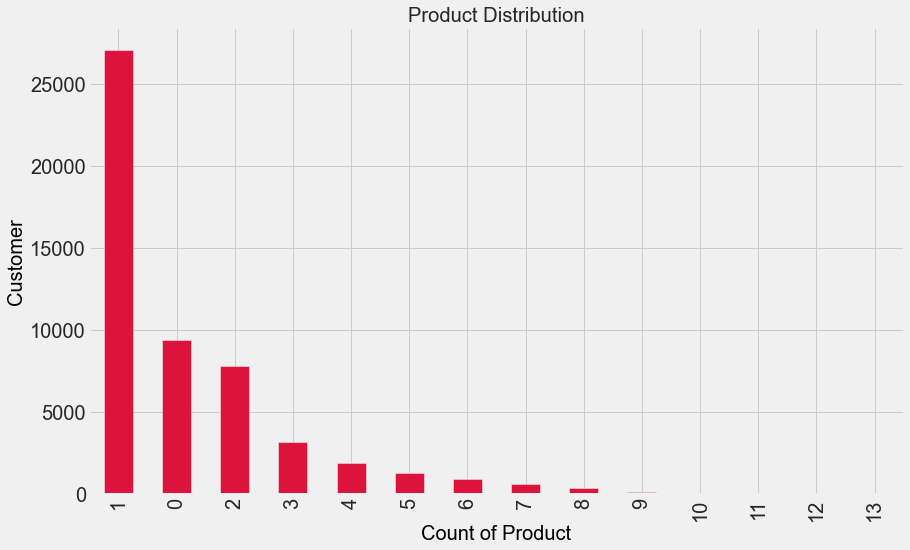

In [69]:
plt.figure(figsize=(13,8))
plt.style.use('fivethirtyeight')

cr['num_products'].value_counts().plot(kind = 'bar', 
                                   title = 'Product Distribution', 
                                   fontsize = '20' , color = 'crimson')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")

### The majority of customers own at least one product. It is advantageous to keep the focus on promoting at least one product because customers are more likely to have the one product. 


## Average age as per number of products

In [70]:
cr.groupby('num_products')['age'].mean()

num_products
0     43.521795
1     35.287406
2     48.494323
3     48.856423
4     47.139052
5     47.694942
6     47.897463
7     48.304762
8     48.702941
9     50.261438
10    49.156863
11    49.941176
12    49.111111
13    48.000000
Name: age, dtype: float64

Text(0, 0.5, 'Age')

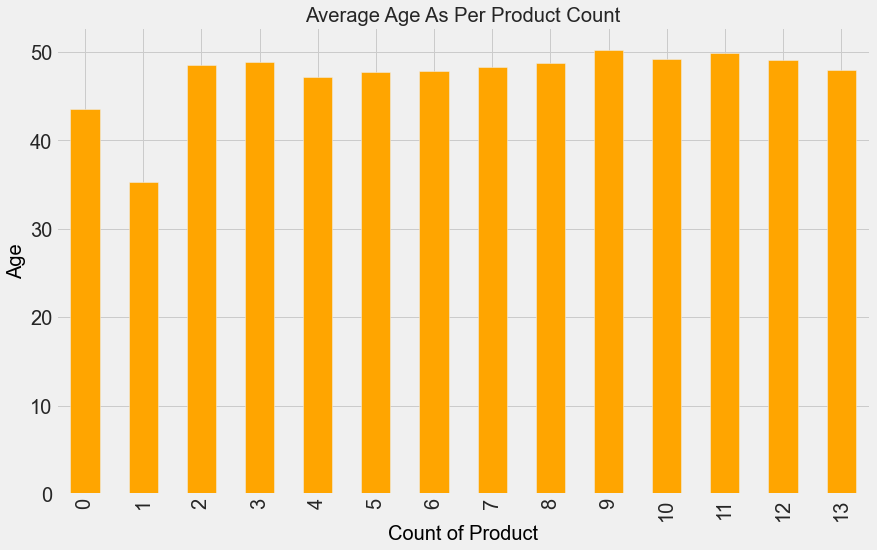

In [71]:
plt.figure(figsize=(13,8))
plt.style.use('fivethirtyeight')
cr.groupby('num_products')['age'].mean().plot(kind = 'bar' , title = 'Average Age As Per Product Count', 
                                   fontsize = '20' , color = 'orange')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Age' , fontsize=20, color="black")

### The average age for College Grads is 24, 50 for Individuals, and 55 for VIPs, therefore according to this chart, promoting more than two products to Individuals and VIPs has the potential to boost revenue.


## Less than 287000 income and their product

In [72]:
income_count = cr['gross_income'] < 287000

In [73]:
print(cr[income_count].num_products.value_counts())
print('Total Customer Count :' ,cr[income_count].num_products.value_counts().sum())

1     25718
0      8772
2      7330
3      2937
4      1746
5      1179
6       882
7       575
8       308
9       135
10       43
11       13
12        8
13        2
Name: num_products, dtype: int64
Total Customer Count : 49648


Text(0, 0.5, 'Customer')

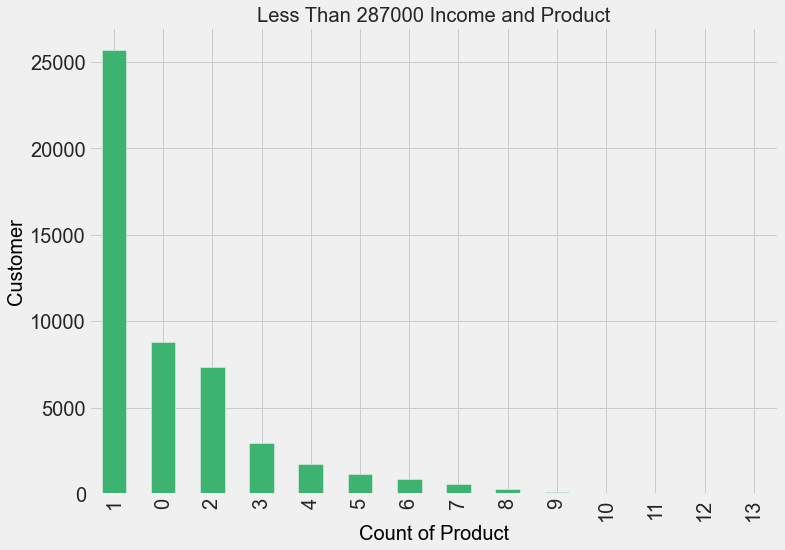

In [74]:
plt.figure(figsize=(11,8))
plt.style.use('fivethirtyeight')


cr[income_count].num_products.value_counts().plot(kind = 'bar', 
                                   title = 'Less Than 287000 Income and Product', 
                                   fontsize = '20' , color = 'mediumseagreen')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")

### It is worthwhile to promote the majority of all products to consumers with gross incomes less than 287000, as this chart shows that those with less than 287k are more likely to purchase any product from us.


## More than 287000 income and their product

In [75]:
print(cr[~income_count].num_products.value_counts())
print('Total Customer Count :' , cr[~income_count].num_products.value_counts().sum())

1     1390
0      634
2      509
3      239
4      131
5      106
6       64
7       55
8       32
9       18
10       8
11       4
12       1
Name: num_products, dtype: int64
Total Customer Count : 3191


Text(0, 0.5, 'Customer')

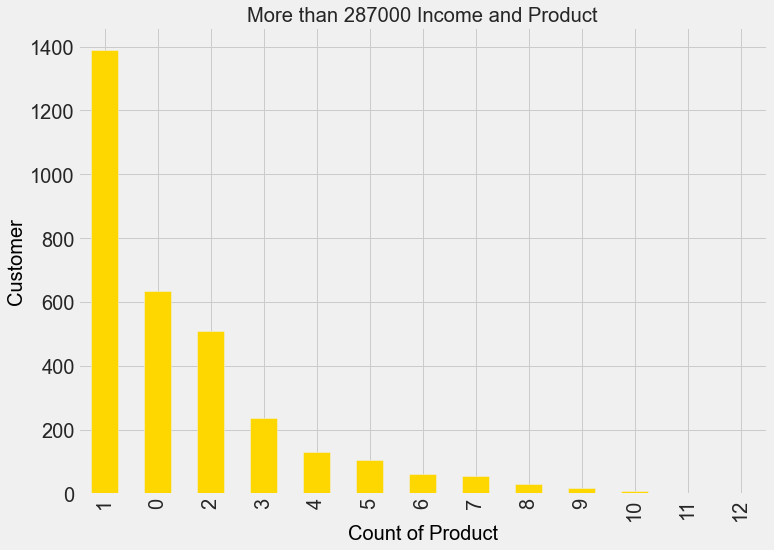

In [76]:
plt.figure(figsize=(11,8))
plt.style.use('fivethirtyeight')

cr[~income_count].num_products.value_counts().plot(kind = 'bar', 
                                   title = 'More than 287000 Income and Product', 
                                   fontsize = '20' , color = 'gold')
plt.xlabel('Count of Product' , fontsize=20, color="black")
plt.ylabel('Customer' , fontsize=20, color="black")

### Customers with greater than 287000 gross income tend to purchase less products from us, but as the chart illustrates, this is an excellent opportunity to target them in order to improve revenue.


## Customer count whose income is more than 287000
### (Segment wise)

In [77]:
cr[~income_count].segment.value_counts()

Individuals          2149
College_Graduated     787
VIP                   255
Name: segment, dtype: int64

Text(0, 0.5, 'Segment')

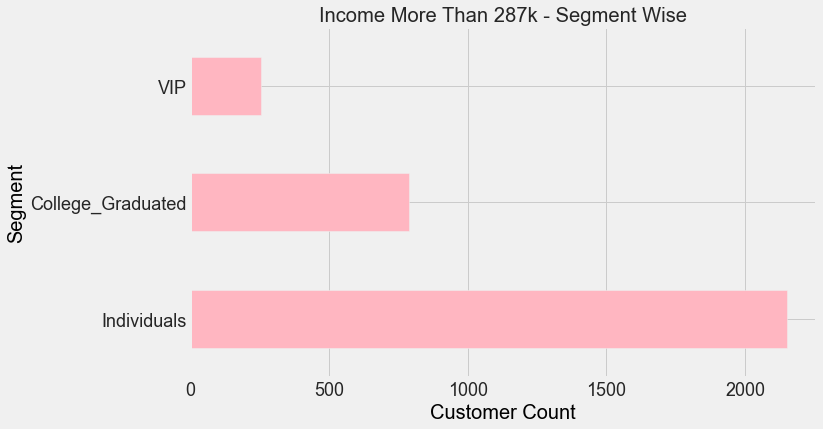

In [78]:
plt.figure(figsize=(10,6))
plt.style.use('fivethirtyeight')
cr[~income_count].segment.value_counts().plot(kind = 'barh', 
                                              
title = 'Income More Than 287k - Segment Wise', fontsize = '18' , color = 'lightpink')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('Segment' , fontsize=20, color="black")

### According to this plot, the focus should be on Individuals and College Graduates with a gross income of more than $287k.


## Gross income and loan plot on entire dataset

In [79]:
px.scatter(cr, y = 'gross_income' , x = 'num_loans', color = 'segment' , title = 'Gross Income and Loan Relationship',
      width=1000, height=700)

### This scatter plot reveals that customers with less than $287k are more likely to have a loan.


## Gross income less than 287000
### (Loan holder and non holder)

In [80]:
px.scatter(income, y = 'gross_income' , x = 'num_loans', color = 'segment' , title = 'Gross Income Less Than 287000 and Loan Relationship',
      width=1000, height=700)

### This scatter plot reveals that customers with less than $287k are more likely to have a loan.

# Credit Card and Loan Analysis

## Own credit card out of all customer

In [81]:
cr['num_credit_cards'].value_counts()

0    50185
1     2654
Name: num_credit_cards, dtype: int64

Text(0, 0.5, 'No                    Yes')

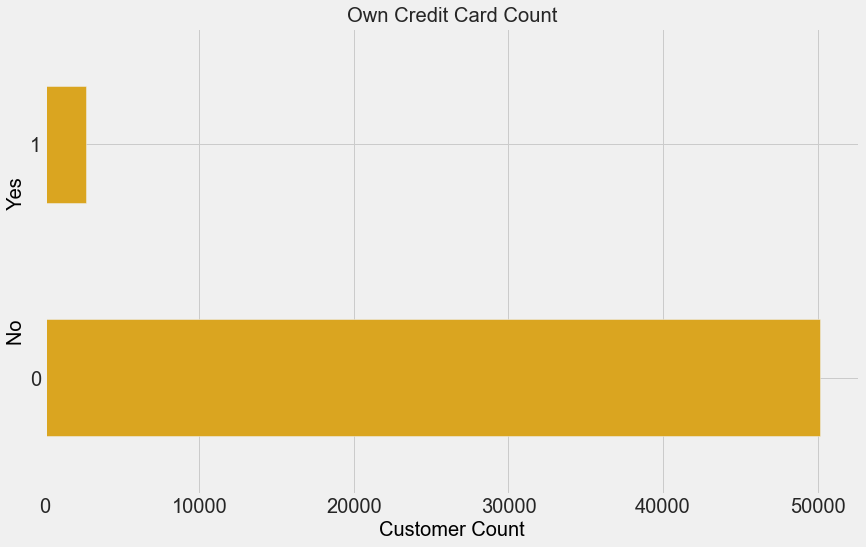

In [82]:
plt.figure(figsize=(13,8))

cr['num_credit_cards'].value_counts().plot(kind = 'barh' , title = 'Own Credit Card Count',
                                   fontsize = '20' , color = 'goldenrod')
plt.xlabel('Customer Count' , fontsize=20, color="black")
plt.ylabel('No                    Yes' , fontsize=20, color="black")

### Only 5% of all consumers have a credit card.


## Owing credit card as per the segment

In [83]:
own_credit_card = cr['num_credit_cards'] == 1
cr[own_credit_card].segment.value_counts()

Individuals          2004
VIP                   508
College_Graduated     142
Name: segment, dtype: int64

<AxesSubplot:title={'center':'Own Creditcard Segment Wise'}, ylabel='segment'>

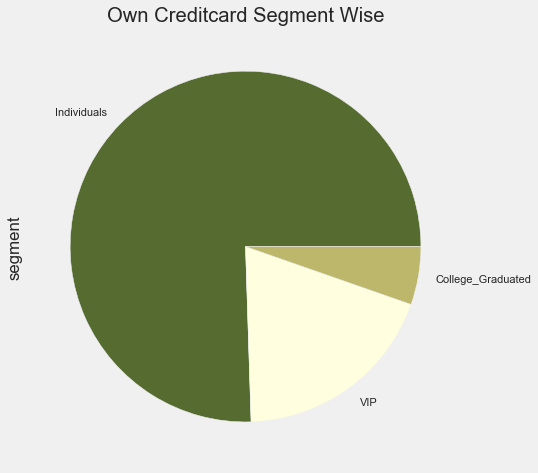

In [84]:
plt.figure(figsize=(7,15))

cr[own_credit_card].segment.value_counts().plot(kind = 'pie' , 
                                   title = 'Own Creditcard Segment Wise' , colors=['darkolivegreen', 'lightyellow', 'darkkhaki'])


### Credit card distribution is highest (75 percent) in the Individual category, yet despite having only 2425 consumers in the VIP group, their credit card share is 19 percent. College grads have fewer credit cards.

## Age and credit card

In [85]:
px.box(cr, y = 'age' , x = 'num_credit_cards', color = 'segment' , title = 'Age & Creditcard Distribution Segment Wise',
      width=900, height=600)

### According to this box plot, the majority of consumers in the Individuals category are between the ages of 41 and 53, and VIPs are between the ages of 45 and 58, therefore we can market more credit cards in this age range. The majority of college graduates do not hold a credit card.


##  Customer distrubution age wise out of 2654 customers who own credit card

### (Maximum number of credit card own by age group)

In [86]:
cr[own_credit_card].age.value_counts().nlargest(15)

43    137
45    137
44    123
46    122
48    121
42    112
41    112
47    111
50     95
49     95
51     94
40     78
54     76
39     71
52     70
Name: age, dtype: int64

Text(0, 0.5, 'Count')

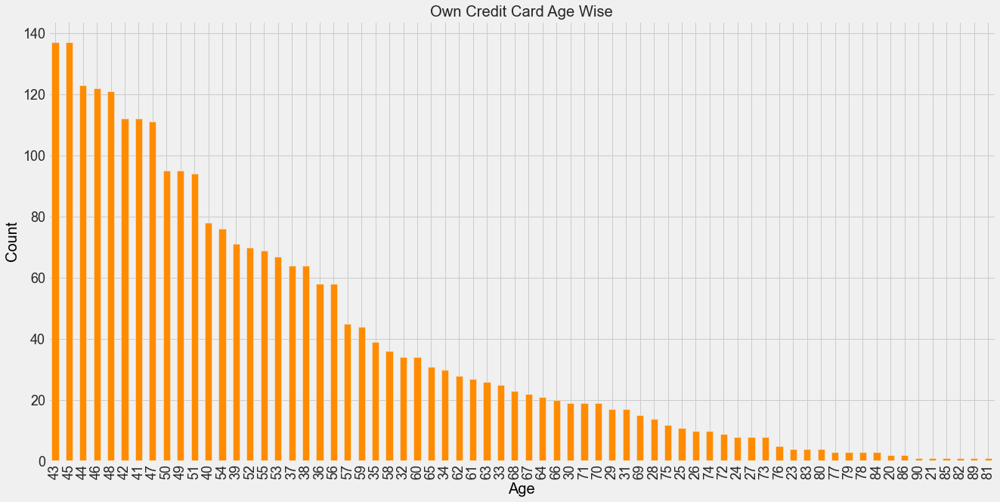

In [87]:
fig , ax = plt.subplots(figsize=(20, 10))

cr[own_credit_card].age.value_counts().plot(kind = 'bar' , title = 'Own Credit Card Age Wise',
                                   fontsize = '18' , color = 'darkorange')
plt.xlabel('Age' , fontsize=20, color="black")
plt.ylabel('Count' , fontsize=20, color="black")

### According to the box plot, the optimal age to promote credit cards is between the ages of 41 and 53.
 

## Loan taken count out of all customers

In [88]:
cr['num_loans'].value_counts()

0    52346
1      493
Name: num_loans, dtype: int64

<AxesSubplot:title={'center':'Loan Taken'}>

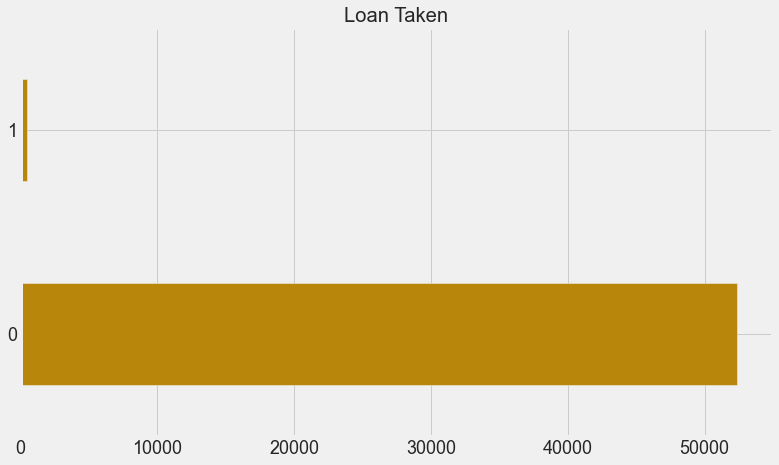

In [89]:
income = cr['gross_income'] > 1

fig , ax = plt.subplots(figsize=(12, 7))
cr[income].num_loans.value_counts().plot(kind = 'barh', title = 'Loan Taken', 
                                   fontsize = '18' , color = 'darkgoldenrod')

### Because just 493 people applied for the loan, there is plenty of potential to promote appropriate loans to households with gross incomes less than $287,000.


## Loan taken as per the segment

In [90]:
taken_loan = cr['num_loans'] == 1
cr[taken_loan].segment.value_counts()

Individuals          430
VIP                   60
College_Graduated      3
Name: segment, dtype: int64

<AxesSubplot:title={'center':'Loan Taken Segment Wise'}>

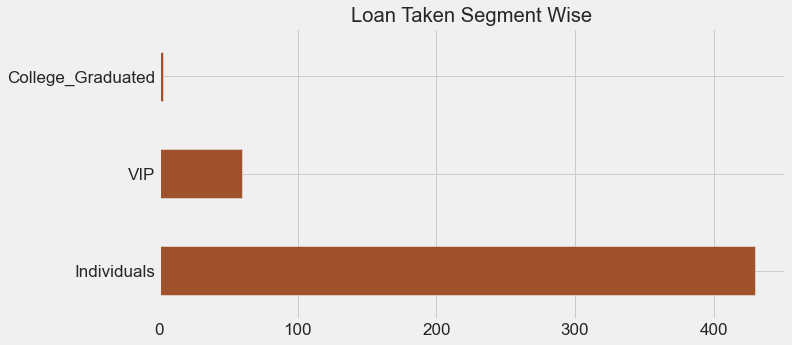

In [91]:
fig , ax = plt.subplots(figsize=(10, 5))

cr[taken_loan].segment.value_counts().plot(kind = 'barh' , title = 'Loan Taken Segment Wise', 
                                   fontsize = '17' , color = 'sienna')

### Market more loans to the Individual sector because they have requested the most loans.


## Age wise distribution out of 493 customers who took loan

<AxesSubplot:title={'center':'Age Wise Loan Count'}>

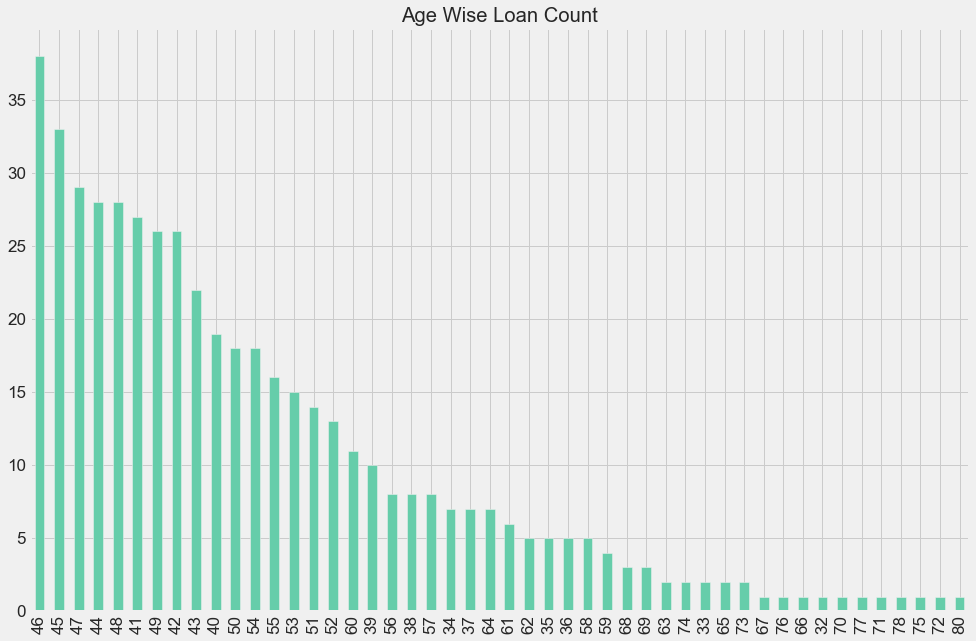

In [92]:
loan_taken = cr['num_loans'] == 1

fig , ax = plt.subplots(figsize=(15, 10))
cr[loan_taken].age.value_counts().plot(kind = 'bar', title = 'Age Wise Loan Count', 
                                   fontsize = '17' , color = 'mediumaquamarine')

### This plot shows that clients in their 40s and 50s have taken out the most loans, thus we should keep them in mind when marketing the loan.
